In [1]:
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.applications.resnet50 import decode_predictions
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import json
import cv2
import random
import sys
import os
import torch
from PIL import Image
import matplotlib.pyplot as plt

# Get the absolute path of the src folder
sys.path.append(os.path.abspath("../src"))

from utils_attack import compute_psnr, compute_ssim, compute_msssim, eval_psnr_ssim_msssim, bytearray_to_bits
from regen_pipe import ReSDPipeline
from regen_attack import DiffWMAttacker
from utils import show_image, preprocess_image, clip_eps, get_label
from whitebox import generate_adversaries_targeted, perturb_image, verify_watermark

2025-03-09 14:20:51.360217: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-09 14:20:51.360248: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-09 14:20:51.361750: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-09 14:20:51.371974: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
tf.keras.backend.clear_session()

In [3]:
wm_text = 'test'
device = 'cuda:0'

print_width = 50

In [4]:
pipe = ReSDPipeline.from_pretrained("stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16, revision="fp16")
pipe.set_progress_bar_config(disable=True)
pipe.to(device)
print('Finished loading model')

model_index.json:   0%|          | 0.00/517 [00:00<?, ?B/s]

/home/amt007/.local/lib/python3.11/site-packages/diffusers/pipelines/pipeline_loading_utils.py:242: FutureWarning: You are loading the variant fp16 from stabilityai/stable-diffusion-2-1 via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(


Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/819 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/628 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/999 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/351 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/681M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

An error occurred while trying to fetch /tmp/xdg-cache/huggingface/hub/models--stabilityai--stable-diffusion-2-1/snapshots/f7f33030acc57428be85fbec092c37a78231d75a/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /tmp/xdg-cache/huggingface/hub/models--stabilityai--stable-diffusion-2-1/snapshots/f7f33030acc57428be85fbec092c37a78231d75a/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
/opt/conda/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
An error occurred while trying to fetch /tmp/xdg-cache/huggingface/hub/models--stabilityai--stable-diffusion-2-1/snapshots/f7f33030acc57428be85fbe

Finished loading model


In [5]:
resnet50 = tf.keras.applications.ResNet50(weights="imagenet", include_top=True, classifier_activation=None)
original_image_path = "../examples/panda.jpg"

2025-03-09 14:21:09.993359: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4963 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080, pci bus id: 0000:84:00.0, compute capability: 6.1


In [6]:
EPS = 3.5/255
IMAGENET_LABELS = "../data/imagenet_class_index.json"

with open(IMAGENET_LABELS) as f:
    IMAGENET_CLASSES = {int(i):x[1] for i,x in json.load(f).items()}


In [7]:
k = 4
secret_labels = [726,264,428,190]
print("Secret labels:", secret_labels)
print("Secret label names:", [IMAGENET_CLASSES[label] for label in secret_labels])



Secret labels: [726, 264, 428, 190]
Secret label names: ['plane', 'Cardigan', 'barrow', 'Sealyham_terrier']


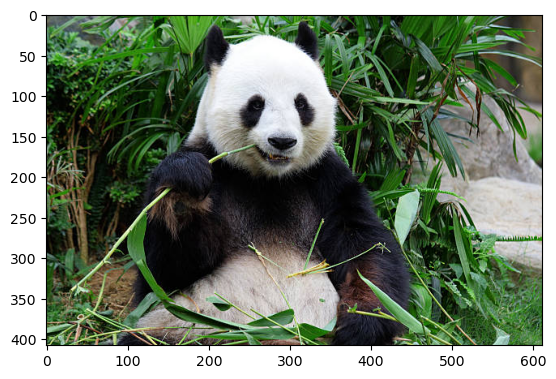

Preprocessed image saved at: ../output/preprocessed_image.png


2025-03-09 14:21:13.425042: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902


1/1 [==============================] - 2s 2s/step
Logits before adv.: [('n02510455', 'giant_panda', 17.555876), ('n02509815', 'lesser_panda', 10.108606), ('n02488702', 'colobus', 9.493948)]
True label (max logit): giant_panda (Index: 388)

Predictions for secret labels BEFORE perturbation:
Label: plane (Index: 726), Logit: -3.12916898727417
Label: Cardigan (Index: 264), Logit: 3.173433542251587
Label: barrow (Index: 428), Logit: 4.072577476501465
Label: Sealyham_terrier (Index: 190), Logit: 1.4021108150482178
Iteration 0, Loss: 48.53371047973633
Iteration 20, Loss: 30.049999237060547
Iteration 40, Loss: 22.57826805114746
Iteration 60, Loss: 21.430662155151367
Iteration 80, Loss: 21.081947326660156
Iteration 100, Loss: 20.671918869018555
Iteration 120, Loss: 20.336517333984375
Iteration 140, Loss: 19.978561401367188
Iteration 160, Loss: 19.611181259155273
Iteration 180, Loss: 19.27535057067871
Iteration 200, Loss: 18.953737258911133
Iteration 220, Loss: 18.64873695373535
Iteration 240, 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Delta image saved at ../output/delta_image.png


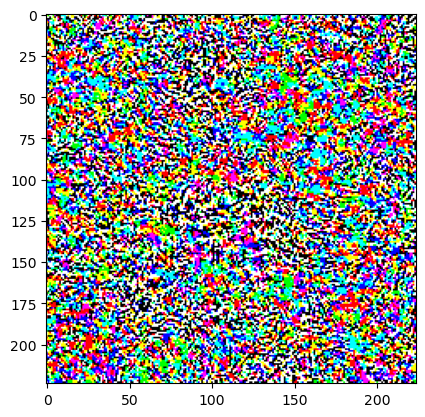

Watermarked image saved as ../output/whitebox_watermarked_image.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


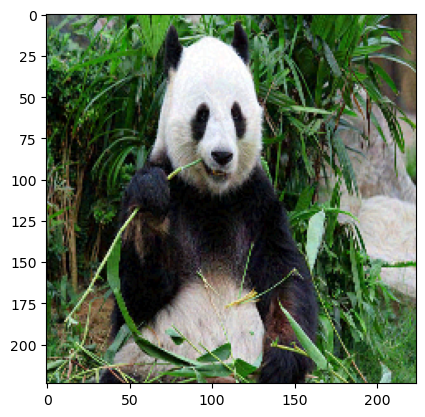

1/1 [==============================] - 0s 36ms/step
Logits after adv.: [('n02510455', 'giant_panda', 6.2379847), ('n02113186', 'Cardigan', 5.3363113), ('n02797295', 'barrow', 5.2696443)]

Predictions for secret labels:
Label: plane (Index: 726), Logit: -0.5851786732673645
Label: Cardigan (Index: 264), Logit: 5.336311340332031
Label: barrow (Index: 428), Logit: 5.269644260406494
Label: Sealyham_terrier (Index: 190), Logit: 4.318972110748291
Label: plane (726) | Logit Before: -3.12917 | Logit After: -0.58518 | Logit Diff: 2.54399
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 5.33631 | Logit Diff: 2.16288
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 5.26964 | Logit Diff: 1.19707
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.31897 | Logit Diff: 2.91686
Percentage of labels with positive logit difference: 100.00%
Watermark verified!


In [8]:
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=5e-3)
perturb = perturb_image("../examples/panda.jpg", 388
              , secret_labels, resnet50, optimizer,EPS, 350)

Diffuse attack initialized with noise step 0 and use prompt 0


1it [00:00,  5.20it/s]
/home/amt007/.local/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:308: FutureWarning: `_encode_prompt()` is deprecated and it will be removed in a future version. Use `encode_prompt()` instead. Also, be aware that the output format changed from a concatenated tensor to a tuple.
  deprecate("_encode_prompt()", "1.0.0", deprecation_message, standard_warn=False)
/home/amt007/.local/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:594: FutureWarning: The decode_latents method is deprecated and will be removed in 1.0.0. Please use VaeImageProcessor.postprocess(...) instead
  deprecate("decode_latents", "1.0.0", deprecation_message, standard_warn=False)


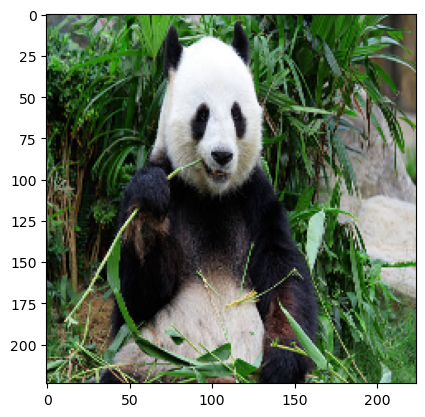

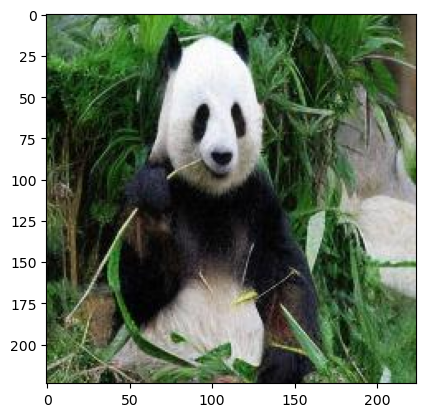

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.14564 | Logit Diff: 0.98353
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.91615 | Logit Diff: -0.25728
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.99827 | Logit Diff: -1.07431
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.52059 | Logit Diff: 3.11848
Percentage of labels with positive logit difference: 50.00%
True [0.9835279, -0.25728035, -1.0743101, 3.1184757]
19.442315149935542 0.4957895576953888 0.8700323700904846
Diffuse attack initialized with noise step 20 and use prompt 0


1it [00:00,  9.67it/s]


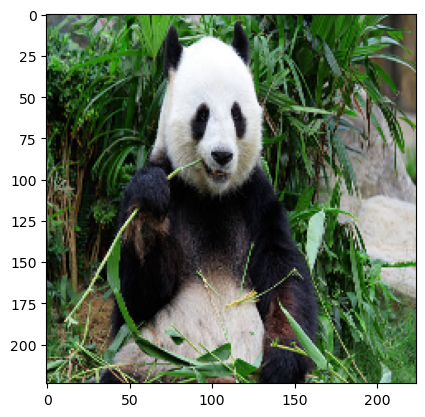

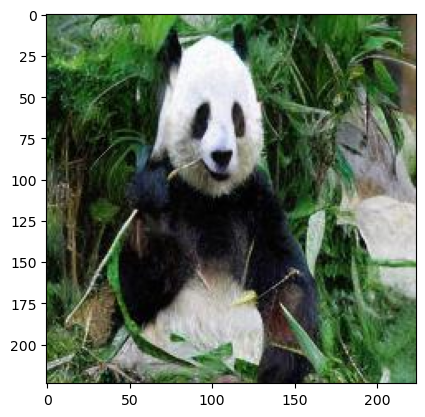

1/1 [==============================] - 0s 37ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.09707 | Logit Diff: 1.03210
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.29719 | Logit Diff: 0.12376
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.15704 | Logit Diff: -0.91554
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.50379 | Logit Diff: 2.10168
Percentage of labels with positive logit difference: 75.00%
True [1.0320983, 0.12375593, -0.9155381, 2.101676]
18.407199771941425 0.44836845993995667 0.8350825905799866
Diffuse attack initialized with noise step 40 and use prompt 0


1it [00:00, 10.15it/s]


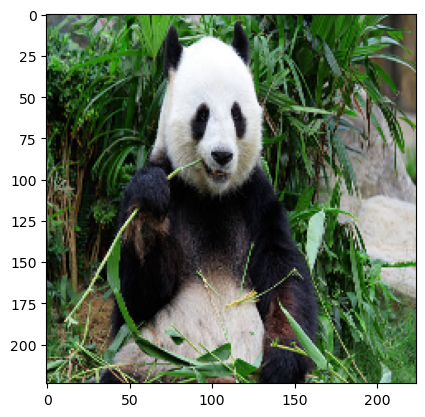

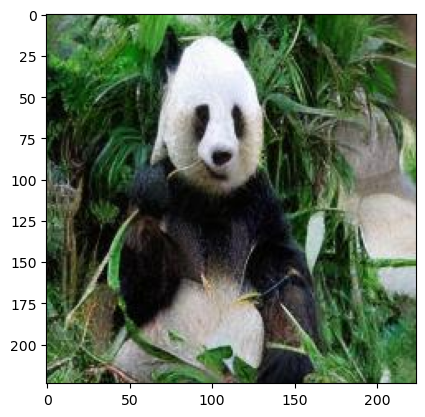

1/1 [==============================] - 0s 37ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.97199 | Logit Diff: 1.15718
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.43572 | Logit Diff: -0.73771
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.99024 | Logit Diff: -1.08234
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 5.09241 | Logit Diff: 3.69030
Percentage of labels with positive logit difference: 50.00%
True [1.1571752, -0.73770905, -1.0823352, 3.6902993]
17.871119089245507 0.4060872495174408 0.8028129935264587
Diffuse attack initialized with noise step 80 and use prompt 0


1it [00:00,  9.67it/s]


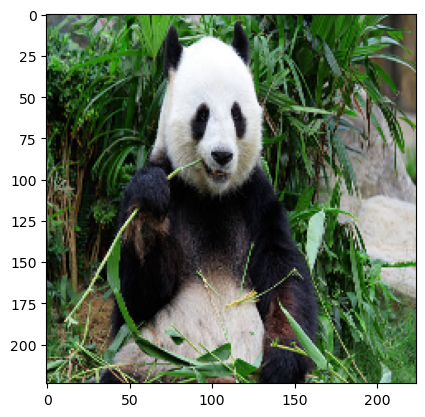

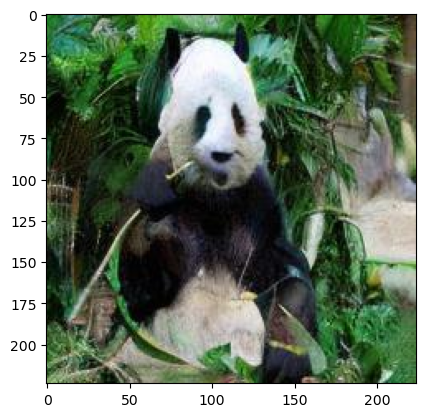

1/1 [==============================] - 0s 34ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.41734 | Logit Diff: 0.71183
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.76042 | Logit Diff: -0.41302
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 4.39875 | Logit Diff: 0.32618
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.25306 | Logit Diff: 2.85095
Percentage of labels with positive logit difference: 75.00%
True [0.711828, -0.41301727, 0.32617617, 2.8509505]
17.139960609148016 0.3564882278442383 0.7581296563148499
Diffuse attack initialized with noise step 160 and use prompt 0


1it [00:00, 87.36it/s]


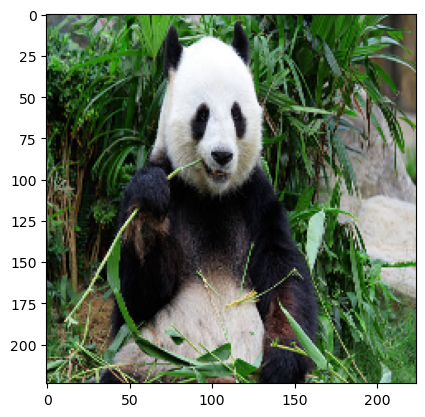

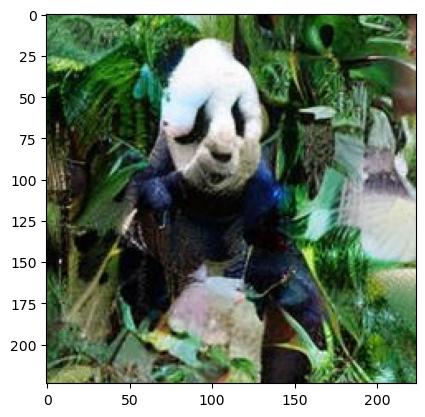

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -4.17402 | Logit Diff: -1.04486
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: -1.46559 | Logit Diff: -4.63902
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.34820 | Logit Diff: -0.72438
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 2.08529 | Logit Diff: 0.68318
Percentage of labels with positive logit difference: 25.00%
False [-1.0448551, -4.639024, -0.72437954, 0.68317604]
15.429305099268099 0.2835894525051117 0.6457302570343018


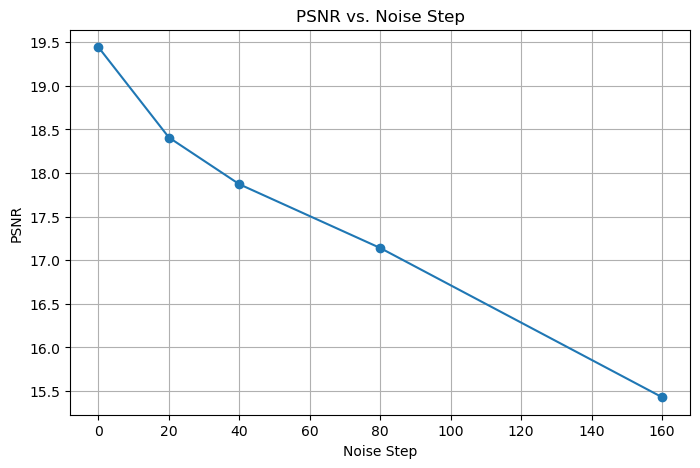

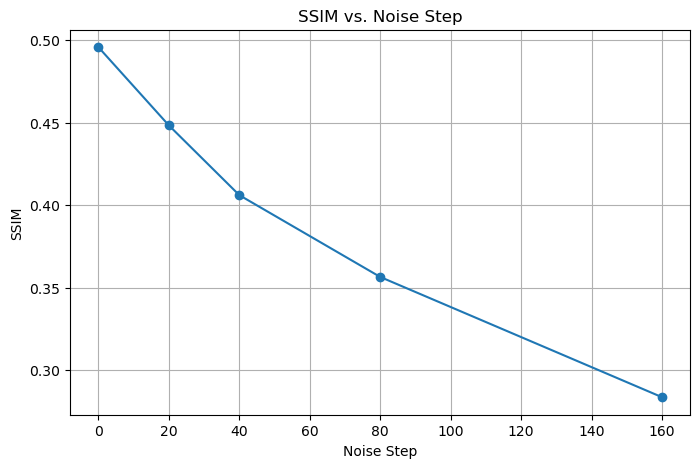

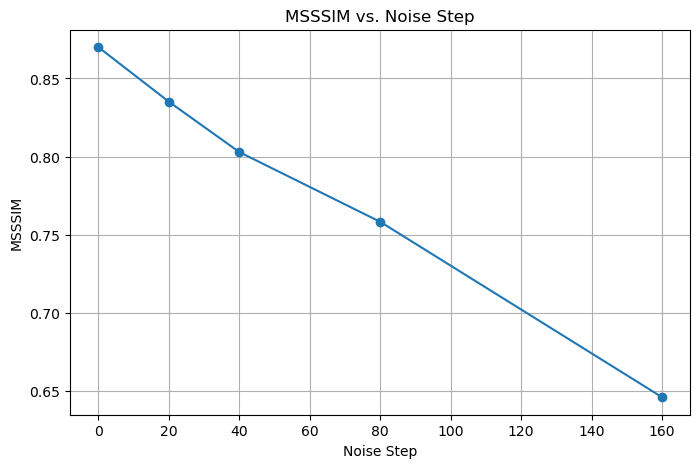

In [9]:
# Define different noise step values
noise_steps = [0, 20, 40, 80, 160]
psnr_values = []
ssim_values = []
msssim_values = []
watermarked_img_path = "../output/whitebox_watermarked_image.jpg"
# Run attack for each noise step
for step in noise_steps:
    attacker = DiffWMAttacker(pipe, batch_size=5, noise_step=step, captions={})
    attacked_img_path = f"../output/perturbed_panda_attacked_{step}.jpg"

    attacker.attack([watermarked_img_path], [attacked_img_path])

    sample_image_org = show_image(original_image_path)
    preprocessed_image_org = preprocess_image(sample_image_org)
    image_tensor_org = tf.constant(preprocessed_image_org, dtype=tf.float32)
    
    sample_image_att = show_image(attacked_img_path)
    preprocessed_image = preprocess_image(sample_image_att)
    image_tensor_att = tf.constant(preprocessed_image, dtype=tf.float32)
    
    original_logits = resnet50.predict(preprocess_input(image_tensor_org))
    attacked_logits = resnet50.predict(preprocess_input(image_tensor_att))

    verified, avg_diff = verify_watermark(original_logits, attacked_logits,
                secret_labels )
    print(verified, avg_diff)

    # Compute PSNR
    psnr, ssim, msssim = eval_psnr_ssim_msssim("../output/preprocessed_image.png", attacked_img_path)
    print(psnr, ssim, msssim)
    ssim_values.append(ssim)
    msssim_values.append(msssim)
    psnr_values.append(psnr)

#Plot PSNR vs. Noise Step
plt.figure(figsize=(8, 5))
plt.plot(noise_steps, psnr_values, marker='o', linestyle='-')
plt.xlabel("Noise Step")
plt.ylabel("PSNR")
plt.title("PSNR vs. Noise Step")
plt.grid()
plt.show()

#Plot ssim vs. Noise Step
plt.figure(figsize=(8, 5))
plt.plot(noise_steps, ssim_values, marker='o', linestyle='-')
plt.xlabel("Noise Step")
plt.ylabel("SSIM")
plt.title("SSIM vs. Noise Step")
plt.grid()
plt.show()

#Plot msssim vs. Noise Step
plt.figure(figsize=(8, 5))
plt.plot(noise_steps, msssim_values, marker='o', linestyle='-')
plt.xlabel("Noise Step")
plt.ylabel("MSSSIM")
plt.title("MSSSIM vs. Noise Step")
plt.grid()
plt.show()

Processing image: epsilon_11.jpg
11
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 54.26it/s]


Finished attacking: epsilon_11.jpg


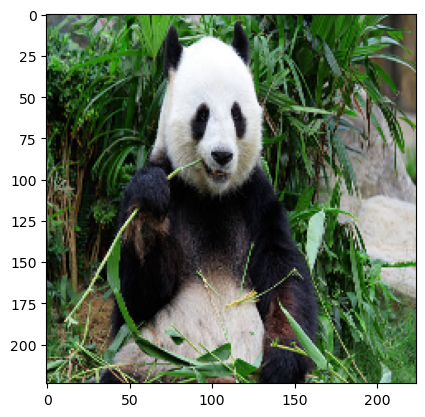

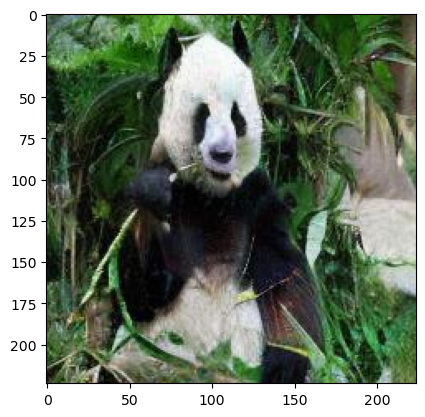

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -3.17697 | Logit Diff: -0.04780
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.95689 | Logit Diff: -0.21654
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.56995 | Logit Diff: -0.50263
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 2.53143 | Logit Diff: 1.12932
Percentage of labels with positive logit difference: 25.00%
Processing image: epsilon_6.jpg
6
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 80.52it/s]


Finished attacking: epsilon_6.jpg


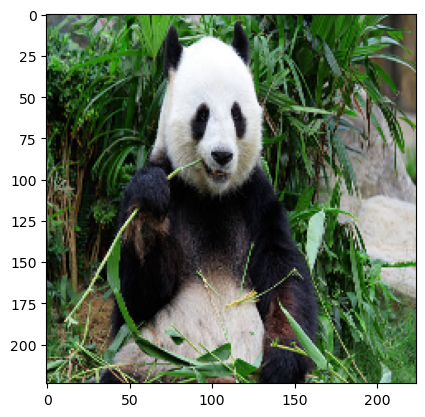

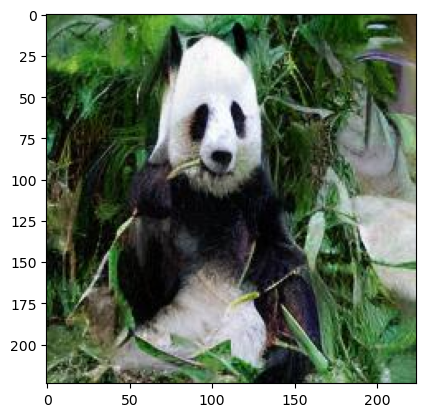

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.99981 | Logit Diff: 0.12936
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.84059 | Logit Diff: -0.33284
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.34054 | Logit Diff: -0.73204
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.28924 | Logit Diff: 1.88713
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_16.jpg
16
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 47.66it/s]


Finished attacking: epsilon_16.jpg


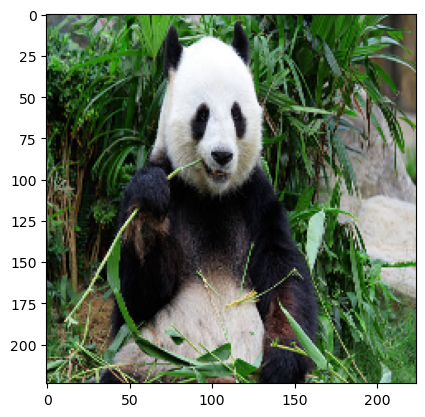

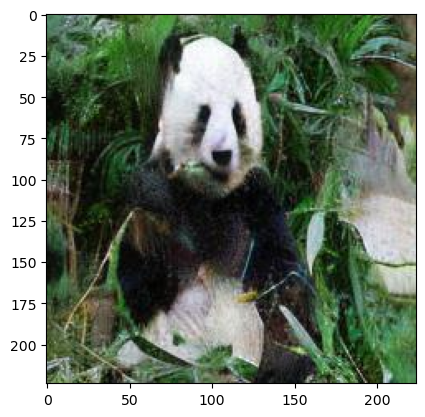

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.19475 | Logit Diff: 0.93442
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.60474 | Logit Diff: 0.43131
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.49170 | Logit Diff: -0.58087
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 5.71864 | Logit Diff: 4.31653
Percentage of labels with positive logit difference: 75.00%
Processing image: epsilon_1.jpg
1
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 98.31it/s]


Finished attacking: epsilon_1.jpg


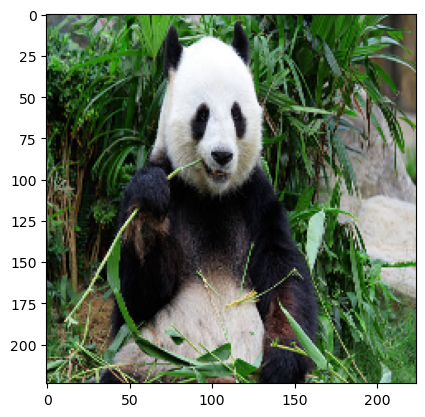

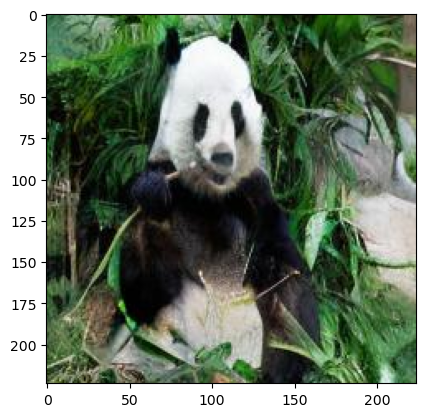

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.78565 | Logit Diff: 0.34352
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.99511 | Logit Diff: -0.17832
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.53411 | Logit Diff: -0.53847
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.45999 | Logit Diff: 2.05788
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_8.jpg
8
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 84.72it/s]


Finished attacking: epsilon_8.jpg


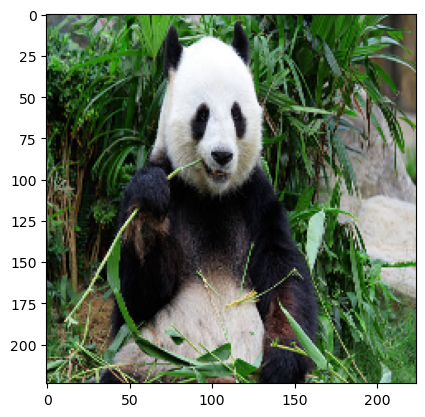

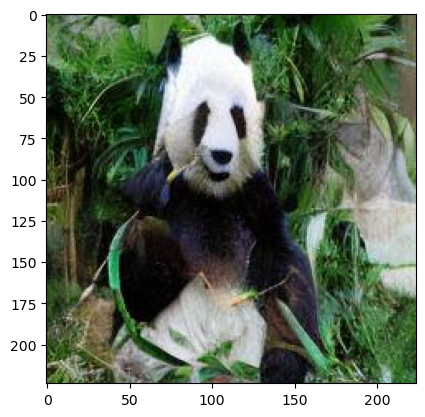

1/1 [==============================] - 0s 38ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.79033 | Logit Diff: 0.33884
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.30504 | Logit Diff: -0.86840
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.72175 | Logit Diff: -0.35083
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.78134 | Logit Diff: 2.37923
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_9.jpg
9
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 90.56it/s]


Finished attacking: epsilon_9.jpg


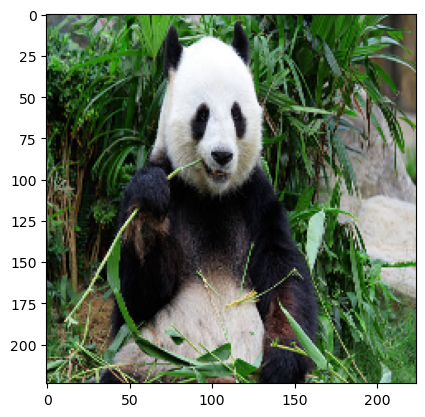

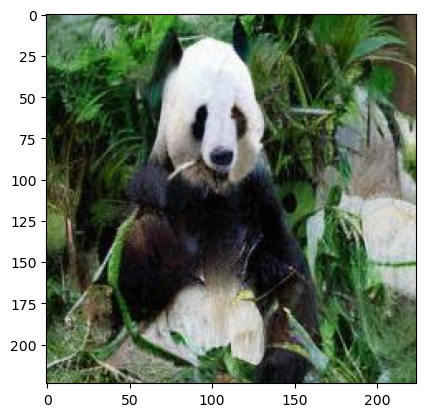

1/1 [==============================] - 0s 38ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.47658 | Logit Diff: 0.65259
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.49541 | Logit Diff: -0.67802
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 4.26212 | Logit Diff: 0.18955
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.83430 | Logit Diff: 2.43219
Percentage of labels with positive logit difference: 75.00%
Processing image: epsilon_10.jpg
10
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 71.31it/s]


Finished attacking: epsilon_10.jpg


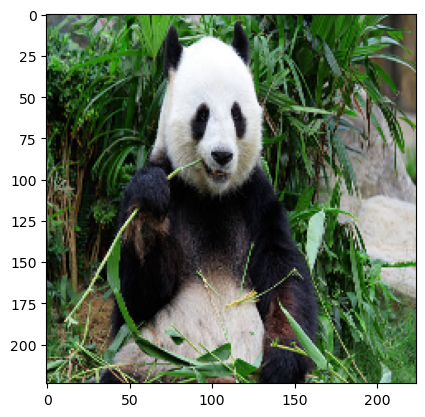

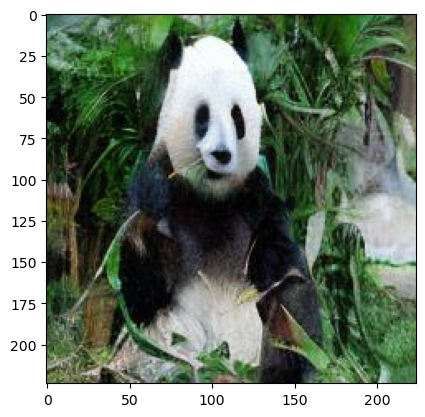

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.36341 | Logit Diff: 0.76576
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 1.81512 | Logit Diff: -1.35831
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.61069 | Logit Diff: -1.46189
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 2.43815 | Logit Diff: 1.03604
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_7.jpg
7
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 90.62it/s]


Finished attacking: epsilon_7.jpg


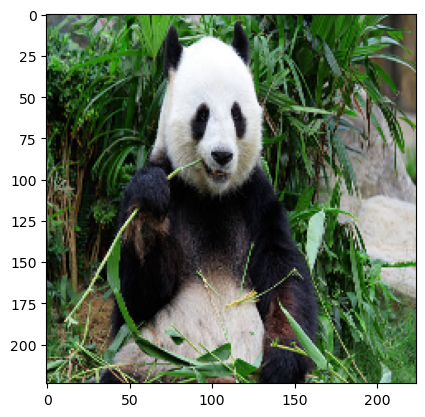

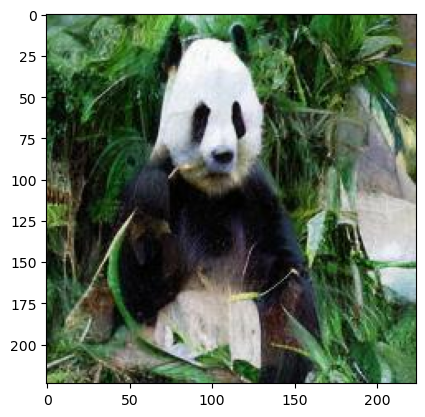

1/1 [==============================] - 0s 33ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.78293 | Logit Diff: 1.34624
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.33075 | Logit Diff: -0.84269
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.81449 | Logit Diff: -1.25809
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.89267 | Logit Diff: 2.49056
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_13.jpg
13
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 85.43it/s]


Finished attacking: epsilon_13.jpg


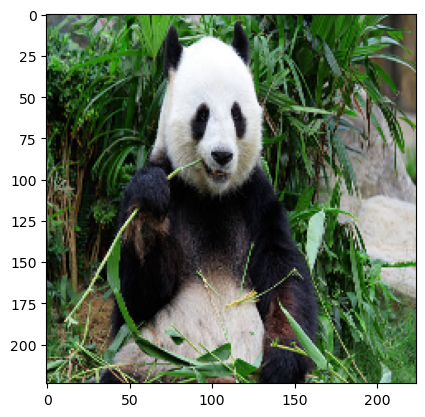

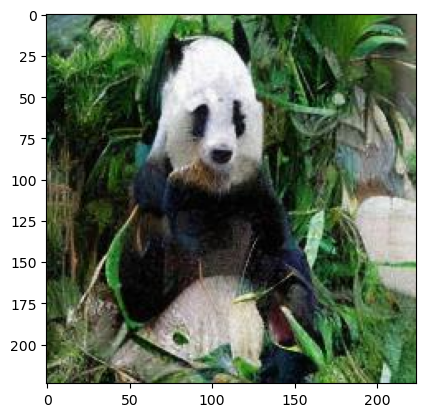

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.57565 | Logit Diff: 0.55352
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 1.83935 | Logit Diff: -1.33409
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.82435 | Logit Diff: -1.24823
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.09345 | Logit Diff: 2.69133
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_4.jpg
4
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 81.83it/s]


Finished attacking: epsilon_4.jpg


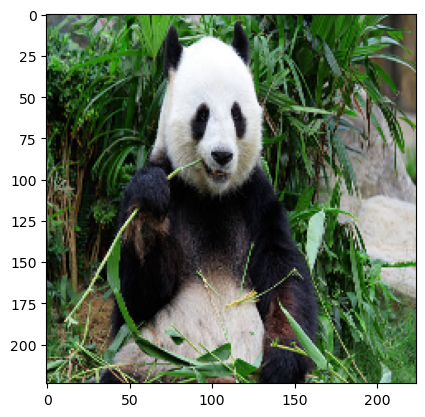

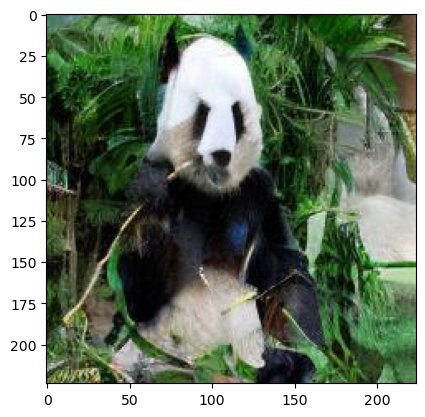

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.15983 | Logit Diff: 0.96934
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.24186 | Logit Diff: -0.93157
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.91864 | Logit Diff: -0.15394
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.04515 | Logit Diff: 2.64304
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_14.jpg
14
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 95.28it/s]


Finished attacking: epsilon_14.jpg


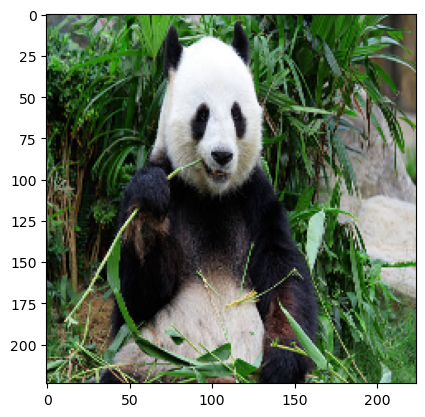

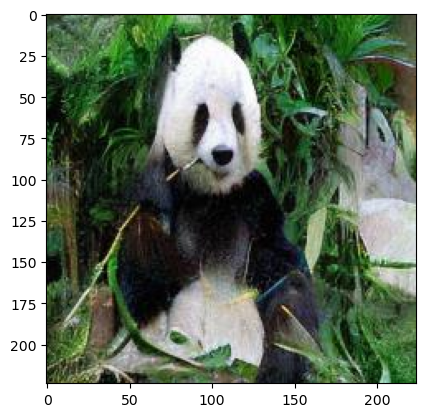

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.58295 | Logit Diff: 1.54622
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.80604 | Logit Diff: -0.36739
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.48145 | Logit Diff: -0.59112
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.26098 | Logit Diff: 2.85887
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_3.jpg
3
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 83.44it/s]


Finished attacking: epsilon_3.jpg


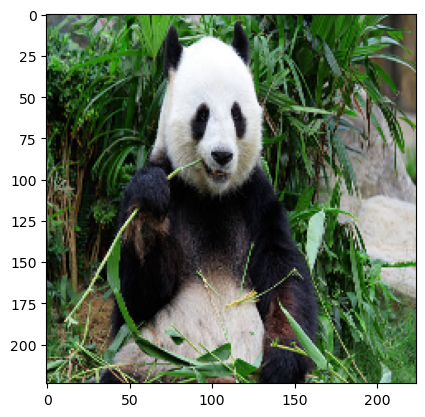

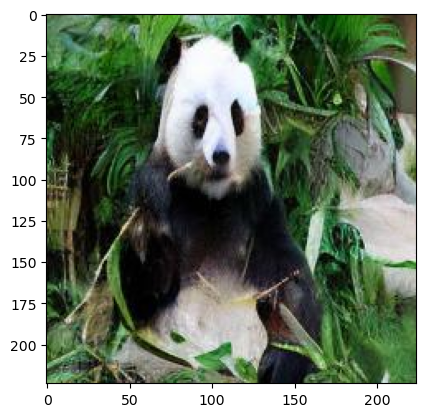

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.33299 | Logit Diff: 0.79618
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.10689 | Logit Diff: -1.06654
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.75502 | Logit Diff: -1.31756
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 2.79643 | Logit Diff: 1.39432
Percentage of labels with positive logit difference: 50.00%
Processing image: epsilon_15.jpg
15
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 80.94it/s]


Finished attacking: epsilon_15.jpg


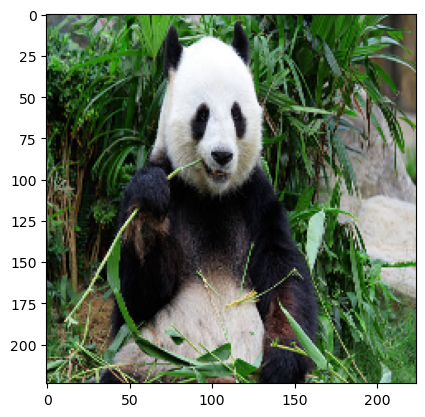

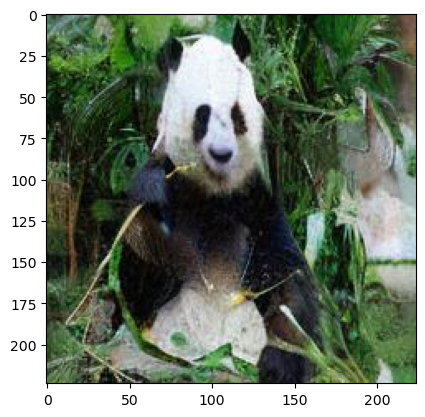

1/1 [==============================] - 0s 30ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.40160 | Logit Diff: 0.72757
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.98313 | Logit Diff: 0.80970
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 4.43248 | Logit Diff: 0.35990
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 5.93368 | Logit Diff: 4.53157
Percentage of labels with positive logit difference: 100.00%
Processing image: epsilon_2.jpg
2
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 89.74it/s]


Finished attacking: epsilon_2.jpg


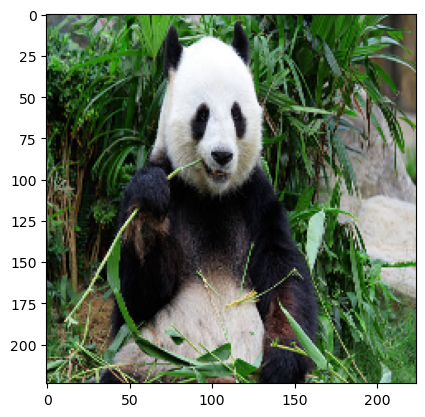

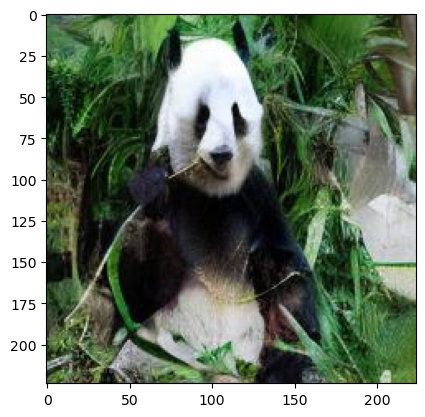

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.94047 | Logit Diff: 0.18870
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.71298 | Logit Diff: 0.53955
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.84054 | Logit Diff: -0.23204
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 2.67167 | Logit Diff: 1.26956
Percentage of labels with positive logit difference: 75.00%
Processing image: epsilon_12.jpg
12
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 96.70it/s]


Finished attacking: epsilon_12.jpg


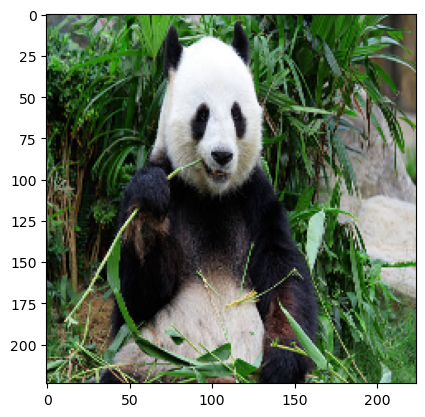

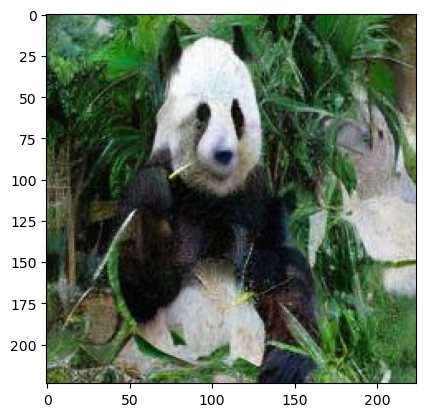

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.91591 | Logit Diff: 1.21326
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.68661 | Logit Diff: 0.51318
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.85323 | Logit Diff: -1.21935
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.40378 | Logit Diff: 3.00167
Percentage of labels with positive logit difference: 75.00%
Processing image: epsilon_5.jpg
5
Diffuse attack initialized with noise step 60 and use prompt 0
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 82.27it/s]


Finished attacking: epsilon_5.jpg


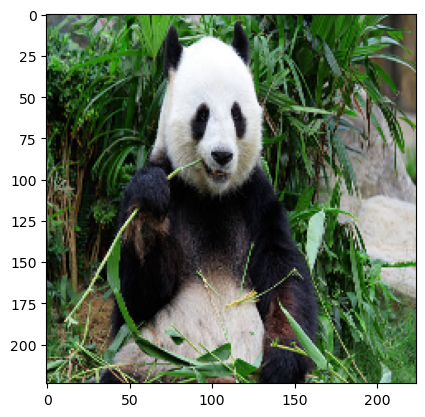

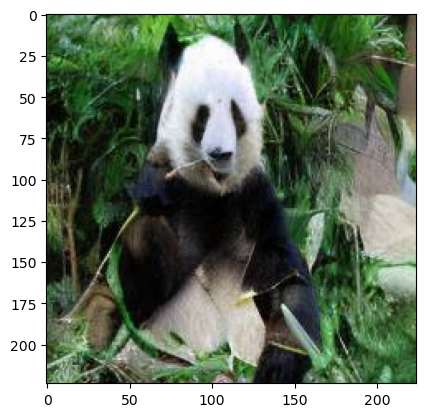

1/1 [==============================] - 0s 33ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.14978 | Logit Diff: 0.97939
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.38597 | Logit Diff: -0.78746
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 4.22307 | Logit Diff: 0.15049
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 2.72631 | Logit Diff: 1.32420
Percentage of labels with positive logit difference: 75.00%


In [16]:
logit_diffs_dic = {}
# Directory where the images are stored
image_dir = "../output/testing_epsilon"

# Get a list of all images in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))]  # Modify for other extensions if needed

# Make sure there are images to process
if not image_files:
    print("No images found in the directory.")
else:
    # Iterate over each image file
    
    for image_file in os.listdir(image_dir):
        # Construct the full image path
        image_path = os.path.join(image_dir, image_file)
        
        print(f"Processing image: {image_file}")

        watermarked_img_path = image_path
        index = image_file.index(".")
        print(image_file[8:index])
        attacked_img_path = f"../output/attacked_images/perturbed_panda_attacked{image_file[8:index]}.jpg"
        
        image = Image.open(watermarked_img_path).convert("RGB")
        
        attacker = DiffWMAttacker(pipe, batch_size=5, noise_step=60, captions={})
        attacker_name = "diff_attacker_60"
        
        print('*' * print_width)
        print(f'Attacking PGD WhiteBox Watermark with {attacker_name}')
        
        
        # Apply the attack
        attacker.attack([watermarked_img_path], [attacked_img_path])
        
        print(f'Finished attacking: {image_file}')

        original_image_path = "../examples/panda.jpg"
        sample_image_org = show_image(original_image_path)
        preprocessed_image_org = preprocess_image(sample_image_org)
        image_tensor_org = tf.constant(preprocessed_image_org, dtype=tf.float32)
        
        sample_image_att = show_image(attacked_img_path)
        preprocessed_image = preprocess_image(sample_image_att)
        image_tensor_att = tf.constant(preprocessed_image, dtype=tf.float32)
        
        original_logits = resnet50.predict(preprocess_input(image_tensor_org))
        attacked_logits = resnet50.predict(preprocess_input(image_tensor_att))

        verif, avg_diff = verify_watermark(original_logits, attacked_logits,
                 [726, 264, 428, 190])

        dic_key = int(image_file[8:index])
        logit_diffs_dic[dic_key] = avg_diff
        
      


In [17]:
sorted_logit_diffs_dic = {key: logit_diffs_dic[key] for key in sorted(logit_diffs_dic)}

In [18]:
epsilon_values = np.arange(0, 8/255, 0.5/255)

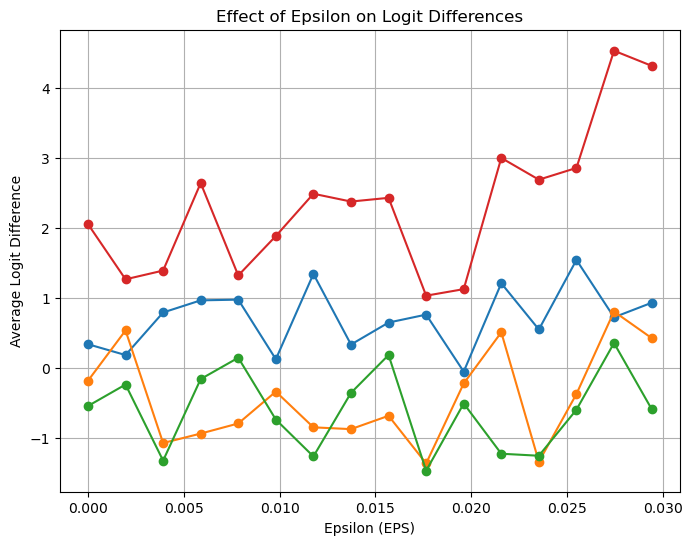

In [19]:
plt.figure(figsize=(8, 6))
plt.plot(epsilon_values, sorted_logit_diffs_dic.values(), marker='o', linestyle='-')
plt.xlabel("Epsilon (EPS)")
plt.ylabel("Average Logit Difference")
plt.title("Effect of Epsilon on Logit Differences")
plt.grid(True)
plt.show()